#Authors
Created by Anant Joshi and Pranav Ghaskadbi

# Introduction

This Python notebook contains the code for the final project for CS 271-02 Group 5 at SJSU for Fall 2021

The Github folder contains a pre-trained model checkpoint which is used to restore the model and then generate musical sequences. 

The checkpoint must be uploaded to /tmp/rl_tuner

#Important Notes
-

Reward Scalar: 2 |
Discount Rate 0.5 |
Number of notes in composition: 64

### Use Older Version of Tesnorflow For Code Compatiility 

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


### Install Essential Packages

In [ ]:
!pip install numpy
!pip install magenta
!pip install scipy
!pip install importlib
!pip install note_seq
!pip install pyfluidsynth

  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=9456a4f2273bb0ec41c8c8d6e7830066217f3553c23ae40ebaedac7d7122fc00
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: gast
    Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kapre 0.3.6 requires tensorflow>=2.0.0, but you have tensorflow 1.15.2 which is incompatible.
  Created wheel for importlib: filename=importlib-1.0.4-py3-none-any.whl size=5874 sha256=98bd9de127b13c04a0689b1dd45c77adb08309bcf1192c62ab1dfb84391085cb
  Stored in directory: /root/.cache/pip/wheels/86/e4/cb/62b0e9efd7da1e984baec0c0ded0b727a7ed25e1904ed51fca
Successfully built importlib
     |██████████████

###Import Miscellaneous Essential Packages

In [ ]:
import tensorflow as tf
import numpy as np
import sys
import magenta
import note_seq
from importlib import reload

import ctypes.util
orig_ctypes_util_find_library = ctypes.util.find_library
def proxy_find_library(lib):
  if lib == 'fluidsynth':
    return 'libfluidsynth.so.1'
  else:
    return orig_ctypes_util_find_library(lib)
ctypes.util.find_library = proxy_find_library

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
print(tf.version.VERSION)
print(magenta.version)

1.15.2
<module 'magenta.version' from '/tensorflow-1.15.2/python3.7/magenta/version.py'>


In [ ]:
# Place to save your model checkpoints and compositions
SAVE_PATH = "/tmp/rl_tuner/"

Create RL_Tuner Foler in temp for storing checkpoint files

In [ ]:
import os.path
from os import path
if path.exists('/tmp/rl_tuner/') == False:
  os.mkdir('/tmp/rl_tuner')

Fetch Essential Modified Custom RL_Tuner Dependency Files and Trained Checkpoint Files
These files are being fetched from our personal repository - we were not able to access these files from our teams official CS271 repo

In [ ]:
!git clone https://github.com/PGhaskadbi/CS271

Cloning into 'CS271'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 27 (delta 10), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (27/27), done.


In [ ]:
!mv -f "/content/CS271/rl_tuner.py" "../tensorflow-1.15.2/python3.7/magenta/models/rl_tuner/"
!mv -f "/content/CS271/rl_tuner_ops.py" "../tensorflow-1.15.2/python3.7/magenta/models/rl_tuner/"
!mv -f "/content/CS271/note_rnn_loader.py" "../tensorflow-1.15.2/python3.7/magenta/models/rl_tuner/"

!mv -f  "/content/CS271/Checkpoint_Files/rl_tuner.ckpt-5950000.data-00000-of-00001" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Checkpoint_Files/rl_tuner.ckpt-5950000.index" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Checkpoint_Files/rl_tuner.ckpt-5950000.meta" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Reward_Files/psi-5950000.data-00000-of-00001" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Reward_Files/psi-5950000.index" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Reward_Files/psi-5950000.meta" "../tmp/rl_tuner/"
!mv -f  "/content/CS271/Reward_Files/psi-5950000.npz" "../tmp/rl_tuner/"

Import Custom RL_Tuner File

In [ ]:
from magenta.models.rl_tuner import rl_tuner_ops
from magenta.models.rl_tuner import rl_tuner

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



Reloading to ensure new custom Magenta files exist in Colab

In [ ]:
reload(rl_tuner_ops)
reload(rl_tuner)
rl_tuner.reload_files()

DQN Hyperparameter Settings

In [ ]:
# Model parameter settings
# ALGORITHM = 'q'
ALGORITHM = 'psi'
REWARD_SCALER = 2
OUTPUT_EVERY_NTH = 50000
NUM_NOTES_IN_COMPOSITION = 64
PRIME_WITH_MIDI = False

Note RNN Hyperparameters

In [ ]:
rl_tuner_hparams = tf.contrib.training.HParams(random_action_probability=0.1,
                                               store_every_nth=1,
                                               train_every_nth=5,
                                               minibatch_size=32,
                                               discount_rate=0.5,
                                               max_experience=100000,
                                               target_network_update_rate=0.01)

In [ ]:
rl_net = rl_tuner.RLTuner(SAVE_PATH, 
                          dqn_hparams=rl_tuner_hparams, 
                          algorithm=ALGORITHM,
                          reward_scaler=REWARD_SCALER,
                          output_every_nth=OUTPUT_EVERY_NTH,
                          num_notes_in_melody=NUM_NOTES_IN_COMPOSITION)




Retrieving checkpoint of Note RNN from Magenta download server.

INFO:tensorflow:Initializing q network
INFO:tensorflow:Using custom hparams
INFO:tensorflow:Initializing melody RNN graph for scope q_network

Instructions for updating:
This class is equivalent as tf.keras.layers.LSTMCell, and will be replaced by that in Tensorflow 2.0.
Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.

Instructions for updating:
Please use `keras.layers.RNN(cell)`, which is equivalent to this API
Instructions for updating:
Please use `layer.add_weight` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

INFO:tensorflow:Initializing target q network
INFO:tensorflow:Using custom hparams
INFO:tensorflow:Initializing melody RNN graph for scope targe

Restore Checkpoint Files - Use the training files

In [ ]:
chk_dir = SAVE_PATH
chk_name = "rl_tuner.ckpt-5950000"
rew_file_name = "psi-5950000.npz"
rl_net.restore_from_directory(chk_dir, checkpoint_name = chk_name, reward_file_name=rew_file_name)

Attempting to restore from checkpoint /tmp/rl_tuner/rl_tuner.ckpt-5950000
INFO:tensorflow:Attempting to restore from checkpoint /tmp/rl_tuner/rl_tuner.ckpt-5950000
INFO:tensorflow:Restoring parameters from /tmp/rl_tuner/rl_tuner.ckpt-5950000
Attempting to load saved reward values from file /tmp/rl_tuner/psi-5950000.npz
INFO:tensorflow:Attempting to load saved reward values from file /tmp/rl_tuner/psi-5950000.npz


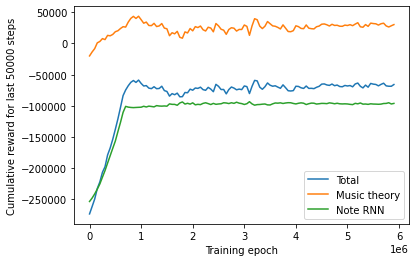

In [ ]:
rl_net.plot_rewards()

INFO:tensorflow:Priming with note 10
INFO:tensorflow:Generated sequence: [0, 0, 1, 16, 0, 0, 1, 21, 0, 30, 26, 0, 28, 18, 0, 16, 0, 9, 0, 0, 1, 14, 16, 16, 0, 0, 14, 0, 13, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 14, 0, 0, 14, 12, 0, 13, 0, 0, 16, 21, 1, 0, 23, 1, 26, 30, 0, 0, 28, 0, 26, 0, 0, 1, 30, 0, 26, 0, 0, 1, 26, 1, 18, 21, 0, 23, 0, 0, 16, 0, 0, 25, 0, 25, 0, 21, 0, 16, 0, 9, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 26, 1, 25, 0, 25, 0, 0, 21, 0, 0, 18, 0, 16, 0, 0, 14, 18, 16, 0, 0, 14, 0, 1, 13, 15, 0, 0, 14, 0, 0, 1, 12, 0, 13, 0, 16, 0, 0, 1, 14, 0, 18, 0, 16, 0, 13, 1, 9, 9, 9, 0, 16, 21, 0, 0, 9, 0, 0, 14, 0, 1, 14, 14, 18, 0, 16, 0, 0, 1, 14, 0, 18, 0, 0, 13, 13, 0, 7, 0, 0, 14, 0, 0, 18, 16, 0, 0, 11, 0, 0, 14, 0, 18, 0, 0, 1, 16, 0, 0, 16, 0, 11, 0, 1, 14, 14, 0, 0, 14, 0, 23, 0, 21, 0, 19, 0, 18, 0, 11, 0, 16, 0, 0, 14, 0, 0, 14, 0, 18, 0, 0, 16, 0, 0, 14, 0, 0, 26, 0, 30, 0, 0, 27, 0, 28, 19, 0, 0, 1, 21, 9, 0, 1, 13, 0, 0, 11, 11, 1, 0, 13, 0, 0, 12, 0,

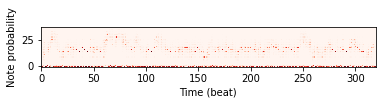

INFO:tensorflow:Priming with note 5
INFO:tensorflow:Generated sequence: [0, 0, 1, 23, 0, 1, 0, 23, 0, 21, 0, 0, 21, 0, 0, 1, 23, 0, 1, 19, 0, 18, 0, 18, 21, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 18, 0, 16, 0, 0, 14, 0, 9, 15, 11, 0, 0, 14, 16, 0, 0, 9, 0, 16, 18, 21, 0, 24, 30, 0, 28, 0, 0, 28, 23, 0, 19, 0, 0, 26, 0, 0, 14, 0, 0, 18, 0, 16, 0, 0, 14, 0, 18, 19, 0, 21, 0, 0, 1, 19, 16, 0, 19, 0, 0, 18, 0, 16, 0, 0, 19, 0, 0, 18, 16, 0, 14, 1, 1, 18, 0, 0, 11, 0, 0, 14, 0, 0, 18, 16, 0, 0, 18, 0, 16, 0, 0, 9, 0, 14, 0, 0, 16, 0, 19, 20, 23, 0, 21, 0, 0, 1, 19, 0, 18, 0, 14, 0, 0, 9, 0, 0, 18, 0, 16, 0, 0, 11, 0, 0, 9, 13, 0, 14, 0, 1, 9, 0, 0, 1, 11, 0, 14, 0, 18, 1, 16, 0, 14, 0, 0, 1, 18, 0, 16, 0, 14, 0, 0, 1, 9, 0, 11, 0, 0, 14, 0, 14, 0, 1, 14, 0, 0, 21, 0, 19, 0, 23, 0, 0, 22, 0, 21, 0, 1, 30, 25, 0, 0, 1, 21, 0, 19, 0, 18, 0, 0, 16, 0, 11, 0, 0, 14, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 16, 0, 0, 18, 0, 16, 0, 0, 14, 0, 0, 14, 0, 18, 13, 0, 16, 0, 0, 14, 0, 18, 1, 0, 9, 0, 0, 11, 18, 0, 19

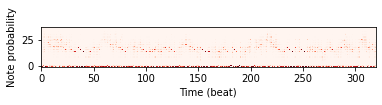

In [ ]:
NUM_SAMPLES = 2
for _ in range(NUM_SAMPLES):
  file_name = 'rtsample'
  rl_net.generate_music_sequence(file_name, visualize_probs = True, length=320)

Python Library for Playing MIDI File Within Google Colab

In [ ]:
!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
!pip install midi2audio
from midi2audio import FluidSynth
from IPython.display import Audio


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 37 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libqt5x11extras5 amd64 5.9.5-0ubuntu1 [8,596 B]
Get:5 http://archive.ubuntu.com/ubuntu bionic/uni

MIDI File Played Here On MIDI File Player

In [ ]:
midi_path = "/tmp/rl_tuner/"
midi_file_name = "rtsample1.mid"

full_midi = midi_path + midi_file_name
FluidSynth("font.sf2").midi_to_audio(full_midi, 'test.wav')
Audio("test.wav")